<a href="https://colab.research.google.com/github/ummeafruz/Machine-Learning-Sessional/blob/main/Neuralnetwork(Task3).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Experiment Name: Introduction to Deep Neural Network (DNN) and exploring different types of Classification Algorithms
Experiment No: 03

Couse No: ETE 456

Course Name: Neural and Fuzzy Systems in Communications Sessional

Submitted By:

                  Name: Umme Afruz

                  Id: 1608011

                  Level: 4

                  Term: II

**Objective:**
1. To learn about Deep Neural Network (DNN).

2. To solve classification problems using Deep Neural Network.

3. To develop DNN models using Tensorflow Framework

4. To apply various classification algorithms on a real world dataset.
 

# Task:
This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective is to predict based on diagnostic measurements whether a patient has diabetes.

Pregnancies: Number of times pregnant

Glucose: Plasma glucose concentration a 2 hours in an oral glucose tolerance test

BloodPressure: Diastolic blood pressure (mm Hg)

SkinThickness: Triceps skin fold thickness (mm)

Insulin: 2-Hour serum insulin (mu U/ml)

BMI: Body mass index (weight in kg/(height in m)^2)

DiabetesPedigreeFunction: Diabetes pedigree function

Age: Age (years)

Outcome: Class variable (0 or 1)


In [75]:
import warnings
warnings.filterwarnings("ignore")

### Import the libraries:
Pandas is an open-source python library that is used for data manipulation and analysis. It provides many functions and methods to speed up the data analysis process. NumPy stands for 'Numerical Python'. It is an open-source Python library used to perform various mathematical and scientific tasks. It contains multi-dimensional arrays and matrices, along with many high-level mathematical functions that operate on these arrays and matrices.

In [76]:
import numpy as np        
import pandas as pd     
import matplotlib.pyplot as plt       

# Machine learning libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

### Dataset:

In [77]:
# Download the data
!wget -O diabetes.csv https://www.dropbox.com/s/sglreynnyx40pb6/diabetes.csv?dl=0

--2021-12-20 20:19:19--  https://www.dropbox.com/s/sglreynnyx40pb6/diabetes.csv?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/sglreynnyx40pb6/diabetes.csv [following]
--2021-12-20 20:19:19--  https://www.dropbox.com/s/raw/sglreynnyx40pb6/diabetes.csv
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc328ba5895cafad1078b9f19dc1.dl.dropboxusercontent.com/cd/0/inline/BcPtykdhNn7Pt93s0hpv7b2UaXdRKn_jBQ3k_NIqx2O8H8zFShYBZ3y5Ib03BFcOgN6nbrLMskmACvVGcZlrRft0oZqsnq23iHh_sRvtHbWTkhksF4zOFelY5vTT-jEmorQUsDl_2wJ8LrByymN-Qyml/file# [following]
--2021-12-20 20:19:19--  https://uc328ba5895cafad1078b9f19dc1.dl.dropboxusercontent.com/cd/0/inline/BcPtykdhNn7Pt93s0hpv7b2UaXdRKn_jBQ3k_NIqx2O8H8zFShYBZ3y5Ib03BFcOgN6nbrLMskmACvVGcZlrR

## Importing the dataset: 

In [78]:
"""importing the dataset """

dataset = pd.read_csv('diabetes.csv')
dataset

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


##Pandas Profiling
Pandas profiling is an open source Python module with which we can quickly do an exploratory data analysis with just a few lines of code.

In [79]:
!pip install pandas-profiling==2.8.0

In [80]:
# # Standard Library Imports
# from pathlib import Path

# Installed packages
import pandas as pd
from ipywidgets import widgets

# Our package
from pandas_profiling import ProfileReport
#from pandas_profiling.utils.cache import cache_file

In [81]:
### To Create the Simple report quickly
profile = ProfileReport(dataset, title='Pandas Profiling Report', explorative=True)

In [82]:
# The Notebook Widgets Interface
profile.to_widgets()

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [83]:
# Or use the HTML report in an iframe
profile.to_file("output.html")

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#Klib
Klib is an python library for importing,cleaning,analyzing and preprocessing data.

In [84]:
! pip install klib

In [85]:
import klib

In [86]:
klib.corr_mat(dataset) # returns a color-encoded correlation matrix

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.00,0.13,0.14,-0.08,-0.07,0.02,-0.03,0.54,0.22
Glucose,0.13,1.00,0.15,0.06,0.33,0.22,0.14,0.26,0.47
BloodPressure,0.14,0.15,1.00,0.21,0.09,0.28,0.04,0.24,0.07
SkinThickness,-0.08,0.06,0.21,1.00,0.44,0.39,0.18,-0.11,0.07
Insulin,-0.07,0.33,0.09,0.44,1.00,0.20,0.19,-0.04,0.13
BMI,0.02,0.22,0.28,0.39,0.20,1.00,0.14,0.04,0.29
DiabetesPedigreeFunction,-0.03,0.14,0.04,0.18,0.19,0.14,1.00,0.03,0.17
Age,0.54,0.26,0.24,-0.11,-0.04,0.04,0.03,1.00,0.24
Outcome,0.22,0.47,0.07,0.07,0.13,0.29,0.17,0.24,1.00


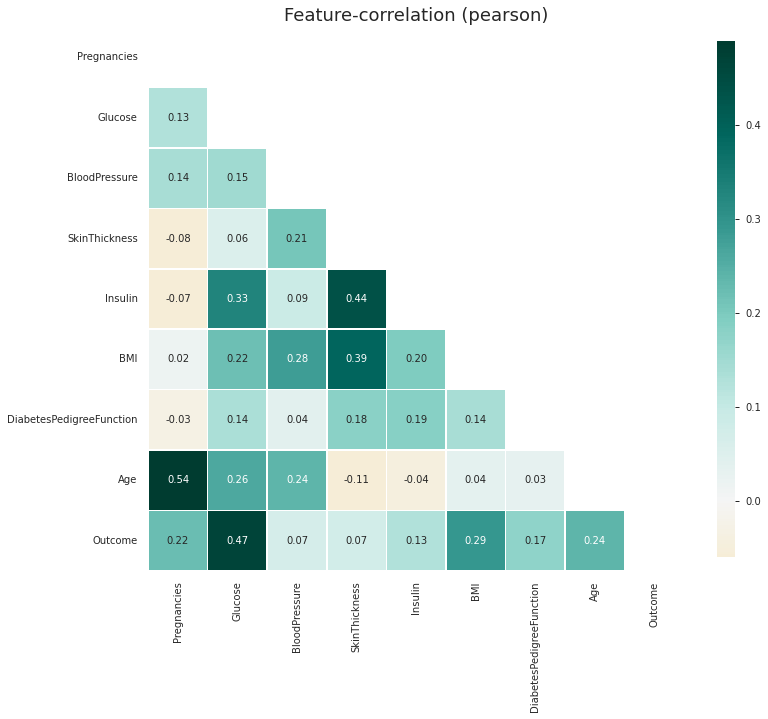

In [87]:
klib.corr_plot(dataset)

In [88]:
feature = dataset[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]  # for independent
target = dataset[['Outcome']]   # for dependent

In [89]:
feature

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63
764,2,122,70,27,0,36.8,0.340,27
765,5,121,72,23,112,26.2,0.245,30
766,1,126,60,0,0,30.1,0.349,47


In [90]:
target

,Outcome
0,1
1,0
2,1
3,0
4,1
...,...
763,0
764,0
765,0
766,1


# Taking care of missing data
Here 'sklearn' means sckit learn which is a package used for machine learning model. It contains many libraries. Preprocessing is a library which contains several classes,methods. From this library we import the Imputer class which will allow us to take care of the missing data.

In [91]:
dataset.isnull().value_counts()

Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin  BMI    DiabetesPedigreeFunction  Age    Outcome
False        False    False          False          False    False  False                     False  False      768
dtype: int64

There is no missing value or NAN in this dataset.

##Splitting the Dataset

Training data is the set of the data on which the actual training takes place. The test set informs us about the final accuracy of the model after completing the training phase

In [98]:
#Spliting the Dataset into Training Set and Test Set.
X_train,X_test,y_train,y_test=train_test_split(feature,target,test_size = 0.2,random_state = 0)
# random_state = 0 is select to get the same result

In [99]:
print(X_train.shape)
print(X_test.shape)

(614, 8)
(154, 8)


In [97]:
X_test

array([[-0.8354355 ,  2.45735903,  0.34674316, ...,  1.35224513,
         2.78594417, -0.96569189],
       [-0.54480808, -0.43719633,  0.24436264, ...,  0.17619533,
        -0.1876381 , -0.88240283],
       [ 0.03644676, -1.41253563, -0.36992051, ...,  0.22677812,
        -0.22668514, -0.71582471],
       ...,
       [ 0.03644676,  0.66399321,  0.85864578, ...,  1.4913478 ,
         0.53623395, -0.96569189],
       [-0.25418066, -0.15403331,  0.24436264, ..., -0.74694053,
        -1.07971278, -0.79911377],
       [-0.8354355 , -0.43719633,  0.14198211, ..., -0.17788417,
         1.06487079, -0.79911377]])

#Feature Scaling
Feature scaling is a method used to normalize the range of independent variables or features of data. In data processing, it is also known as data normalization and is generally performed during the data preprocessing step.

In [100]:
from sklearn.preprocessing import StandardScaler
X_sc = StandardScaler()
y_sc = StandardScaler()
X_train_new = X_sc.fit_transform(X_train[['Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']])
X_test_new = X_sc.transform(X_test[['Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']])

#Logistic Regression
The train-test split procedure is used to estimate the performance of machine learning algorithms when they are used to make predictions on data not used to train the model.

In [105]:
from sklearn.linear_model import LogisticRegression

# Fitting Logistic Regression to the training dataset
lr = LogisticRegression()

lr.fit(X_train,y_train)

LogisticRegression()

In [106]:
# prediction
y_pred = lr.predict(X_test)

In [107]:
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,f1_score,precision_score,recall_score

In [108]:
# Making confusing matrix (actual,prediction)
confusion_matrix(y_test,y_pred)

array([[98,  9],
       [18, 29]])

In [109]:
# Making confusing matrix
# it is used to check the accuracy of the classification
print(classification_report(y_test,y_pred,target_names = ['No','Yes']))

              precision    recall  f1-score   support

          No       0.84      0.92      0.88       107
         Yes       0.76      0.62      0.68        47

    accuracy                           0.82       154
   macro avg       0.80      0.77      0.78       154
weighted avg       0.82      0.82      0.82       154



The accuracy of logistic regression is 82%.

#KNN Classifier
The abbreviation KNN stands for “K-Nearest Neighbour”. It is a supervised machine learning algorithm. The algorithm can be used to solve both classification and regression problem statements. The number of nearest neighbours to a new unknown variable that has to be predicted or classified is denoted by the symbol 'K'.

In [110]:
from sklearn.neighbors import KNeighborsClassifier

# Classifier Model
knn = KNeighborsClassifier(n_neighbors=5, metric = 'minkowski', p=2)
knn.fit(X_train,y_train)
# Prediction
y_pred = knn.predict(X_test)

In [111]:
# Making confusing matrix
print(confusion_matrix(y_test,y_pred))

[[87 20]
 [18 29]]


In [112]:
# Making confusing matrix
# it is used to check the accuracy of the classification
print(classification_report(y_test,y_pred,target_names = ['No','Yes']))

              precision    recall  f1-score   support

          No       0.83      0.81      0.82       107
         Yes       0.59      0.62      0.60        47

    accuracy                           0.75       154
   macro avg       0.71      0.72      0.71       154
weighted avg       0.76      0.75      0.75       154



The accuracy of KNN classifier is 75%.

#SVM
SVM or Support Vector Machine is a linear model for classification and regression problems. It can solve linear and non-linear problems and work well for many practical problems. The idea of SVM is simple: The algorithm creates a line or a hyperplane which separates the data into classes.

In [113]:
from sklearn.svm import SVC

# Classifier Model
sv = SVC(kernel = 'linear', random_state = 0)
sv.fit(X_train,y_train)
# Prediction
y_pred = sv.predict(X_test)

In [114]:
# Making confusing matrix
print(confusion_matrix(y_test,y_pred))

# Making confusing matrix
# it is used to check the accuracy of the classification
print(classification_report(y_test,y_pred,target_names = ['No','Yes']))

[[97 10]
 [18 29]]
              precision    recall  f1-score   support

          No       0.84      0.91      0.87       107
         Yes       0.74      0.62      0.67        47

    accuracy                           0.82       154
   macro avg       0.79      0.76      0.77       154
weighted avg       0.81      0.82      0.81       154



The accuracy of SVM is 82%.

#Decision Tree
Decision tree builds regression or classification models in the form of a tree structure. It breaks down a dataset into smaller and smaller subsets while at the same time an associated decision tree is incrementally developed. The final result is a tree with decision nodes and leaf nodes

In [116]:
from sklearn.tree import DecisionTreeClassifier
# Classifier Model
classifier = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
classifier.fit(X_train,y_train)
# Prediction
y_pred = classifier.predict(X_test)

In [117]:
# Making confusing matrix
print(confusion_matrix(y_test,y_pred))

# Making confusing matrix
# it is used to check the accuracy of the classification
print(classification_report(y_test,y_pred,target_names = ['No','Yes']))

[[79 28]
 [17 30]]
              precision    recall  f1-score   support

          No       0.82      0.74      0.78       107
         Yes       0.52      0.64      0.57        47

    accuracy                           0.71       154
   macro avg       0.67      0.69      0.67       154
weighted avg       0.73      0.71      0.72       154



The accuracy of decision tree is 71%.

#Random Forest
Random Forest Regression is a supervised learning algorithm that uses ensemble learning method for regression. A Random Forest operates by constructing several decision trees during training time and outputting the mean of the classes as the prediction of all the trees.

In [118]:
from sklearn.ensemble import RandomForestClassifier
# Classifier Model
classifier = RandomForestClassifier(n_estimators=10, criterion ='entropy', random_state = 0)
classifier.fit(X_train,y_train)
# Prediction
y_pred = classifier.predict(X_test)

In [119]:
# Making confusing matrix
print(confusion_matrix(y_test,y_pred))

# Making confusing matrix
# it is used to check the accuracy of the classification
print(classification_report(y_test,y_pred,target_names = ['No','Yes']))

[[94 13]
 [20 27]]
              precision    recall  f1-score   support

          No       0.82      0.88      0.85       107
         Yes       0.68      0.57      0.62        47

    accuracy                           0.79       154
   macro avg       0.75      0.73      0.74       154
weighted avg       0.78      0.79      0.78       154



The accuracy of random forest is 79%.

#Naive Bayes
Naive Bayes algorithm is a supervised learning algorithm, which is based on Bayes theorem and used for solving classification problems. It is mainly used in text classification that includes a high-dimensional training dataset. It is a probabilistic classifier, which means it predicts on the basis of the probability of an object

In [120]:
from sklearn.naive_bayes import GaussianNB

# Classifier Model
classifier = GaussianNB()
classifier.fit(X_train,y_train)
# Prediction
y_pred = classifier.predict(X_test)

In [121]:
# Making confusing matrix
print(confusion_matrix(y_test,y_pred))

# Making confusing matrix
# it is used to check the accuracy of the classification
print(classification_report(y_test,y_pred,target_names = ['No','Yes']))

[[93 14]
 [18 29]]
              precision    recall  f1-score   support

          No       0.84      0.87      0.85       107
         Yes       0.67      0.62      0.64        47

    accuracy                           0.79       154
   macro avg       0.76      0.74      0.75       154
weighted avg       0.79      0.79      0.79       154



So, Accuracy = 82% (Logistic regression)

ACccuracy = 75% (KNN classifier)

Accuracy = 82% (SVM)

Accuracy = 71% (Decision tree)

Accuracy = 79% (Random forest)

Accuracy = 79% (Naive Bayes)

Thus, the performance of logistic regression and SVM are better than other algorithms for this dataset according to the accuracy.

#Neural Network

**Building a Multilayer Neural Network with Tensorflow Keras**. 


Before training our model, we have to build it. Building the architecture of a neural network in Keras is done using the **Sequential class**. Layers can be added to whatever numbers you desire. 

First off, we will create a single hidden layer and see how the model performs. 

Since the data we are passing into the model has 1 features, we must define the input_dim parameter in the first layer and set it to 1. Our single hidden is set to have 15 nodes and then it’s passed to the output layer with just one node. Since it is a linear regression problem and the output is just one number, the final layer should have one node. 

In addition, the hidden layer has a ReLu activation function whereas the output function has a linear activation function. If you don’t know what activation functions are, I like to see them as ‘switches’ that are responsible for aggregating the weights of the nodes to give an output to the next node input. 


In [122]:
import warnings
warnings.filterwarnings("ignore")

# Import the libraries

In [123]:
import numpy as np        
import pandas as pd     
import matplotlib.pyplot as plt       

# Machine learning libraries
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

##Dataset

In [124]:
# Download the data
!wget -O diabetes.csv  https://www.dropbox.com/s/sglreynnyx40pb6/diabetes.csv?dl=0

--2021-12-20 20:25:45--  https://www.dropbox.com/s/sglreynnyx40pb6/diabetes.csv?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6022:18::a27d:4212
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/sglreynnyx40pb6/diabetes.csv [following]
--2021-12-20 20:25:45--  https://www.dropbox.com/s/raw/sglreynnyx40pb6/diabetes.csv
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc1308614797f65e31d729878a4b.dl.dropboxusercontent.com/cd/0/inline/BcP9z0X85bacjY2O7HReLVl-U-0L94gmzlcyDR6dmTOFbnWbLWRFPnrxToSA04KwFDXe2A8V81T-cbcjqx0iwmZcQa3f7_ZOk51VVh_Xd1CwDlzZWowaoirs42_btyRX0oEHmlF_PAa1ylEcddjjW501/file# [following]
--2021-12-20 20:25:45--  https://uc1308614797f65e31d729878a4b.dl.dropboxusercontent.com/cd/0/inline/BcP9z0X85bacjY2O7HReLVl-U-0L94gmzlcyDR6dmTOFbnWbLWRFPnrxToSA04KwFDXe2A8V81T-cbcjqx0i

## Importing the dataset

In [125]:
dataset = pd.read_csv('diabetes.csv')
dataset

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [126]:
feature = dataset[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]  # for independent
target = dataset[['Outcome']]   # for dependent

In [127]:
feature

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148,72,35,0,33.6,0.627,50
1,1,85,66,29,0,26.6,0.351,31
2,8,183,64,0,0,23.3,0.672,32
3,1,89,66,23,94,28.1,0.167,21
4,0,137,40,35,168,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63
764,2,122,70,27,0,36.8,0.340,27
765,5,121,72,23,112,26.2,0.245,30
766,1,126,60,0,0,30.1,0.349,47


In [128]:
target

,Outcome
0,1
1,0
2,1
3,0
4,1
...,...
763,0
764,0
765,0
766,1


In [54]:
feature

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6.0,148.0,72.0,35.0,0.0,33.6,0.627,50.0
1,1.0,85.0,66.0,29.0,0.0,26.6,0.351,31.0
2,8.0,183.0,64.0,0.0,0.0,23.3,0.672,32.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0
4,0.0,137.0,40.0,35.0,168.0,43.1,2.288,33.0
...,...,...,...,...,...,...,...,...
763,10.0,101.0,76.0,48.0,180.0,32.9,0.171,63.0
764,2.0,122.0,70.0,27.0,0.0,36.8,0.340,27.0
765,5.0,121.0,72.0,23.0,112.0,26.2,0.245,30.0
766,1.0,126.0,60.0,0.0,0.0,30.1,0.349,47.0


##Splitting the Dataset

In [129]:
"""Spliting the Dataset into Training Set and Test Set """

X_train,X_test,y_train,y_test=train_test_split(feature,target,test_size = 0.2,random_state = 0)
# random_state = 0 is select to get the same result

In [130]:
print(X_train.shape)
print(X_test.shape)

(614, 8)
(154, 8)


In [131]:
X_test

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
661,1,199,76,43,0,42.9,1.394,22
122,2,107,74,30,100,33.6,0.404,23
113,4,76,62,0,0,34.0,0.391,25
14,5,166,72,19,175,25.8,0.587,51
529,0,111,65,0,0,24.6,0.660,31
...,...,...,...,...,...,...,...,...
476,2,105,80,45,191,33.7,0.711,29
482,4,85,58,22,49,27.8,0.306,28
230,4,142,86,0,0,44.0,0.645,22
527,3,116,74,15,105,26.3,0.107,24


#Feature Scaling
Feature Scaling is a technique to standardize the independent features present in the data in a fixed range. 

In [132]:
X_sc = StandardScaler()
X_train = X_sc.fit_transform(X_train)
X_test = X_sc.transform(X_test) 


The code to build the neural network architecture is shown below. 

### Import the Framework:
TensorFlow is an end-to-end open source platform for machine learning. It is an open source artificial intelligence library, using data flow graphs to build models. It allows developers to create large-scale neural networks with many layers. TensorFlow is mainly used for: Classification, Perception, Understanding, Discovering, Prediction and Creation

Keras is a deep learning API written in Python, running on top of the machine learning platform TensorFlow. It was developed with a focus on enabling fast experimentation. Being able to go from idea to result as fast as possible is key to doing good research.

In [133]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense

#Building the neural network architecture
In any neural network, a dense layer is a layer that is deeply connected with its preceding layer which means the neurons of the layer are connected to every neuron of its preceding layer. 

nput dim refers to how many dimensions a tensor has. 

In neural networks, the activation function is a function that is used for the transformation of the input values of neurons. Basically, it introduces the non-linearity into the networks of neural networks so that the networks can learn the relationship between the input and output values.



In [134]:
model = Sequential()
model.add(Dense(20, input_dim=8, activation='relu'))
model.add(Dense(10, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

In [135]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 20)                180       
                                                                 
 dense_4 (Dense)             (None, 10)                210       
                                                                 
 dense_5 (Dense)             (None, 1)                 11        
                                                                 
Total params: 401
Trainable params: 401
Non-trainable params: 0
_________________________________________________________________


The next step is to compile the model. We use an `Adam` optimizer with a **binary_crossentropy**. We defined the validation metrics to be **accuracy**.

In [136]:
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

##Training the Model

The model was trained on 100 epochs with a validation set of 10% of the train data. The validation set helps you check how well the model is learning during the training process, based on the loss function.

In [137]:
#Train the neural network on the train dataset
history = model.fit(X_train, y_train, epochs=100, validation_split=0.1)

Epoch 1/100
18/18 [==============================] - 1s 11ms/step - loss: 0.6772 - accuracy: 0.5942 - val_loss: 0.6267 - val_accuracy: 0.6452
Epoch 2/100
18/18 [==============================] - 0s 3ms/step - loss: 0.6494 - accuracy: 0.6341 - val_loss: 0.6042 - val_accuracy: 0.6935
Epoch 3/100
18/18 [==============================] - 0s 3ms/step - loss: 0.6268 - accuracy: 0.6667 - val_loss: 0.5818 - val_accuracy: 0.6935
Epoch 4/100
18/18 [==============================] - 0s 3ms/step - loss: 0.6045 - accuracy: 0.6757 - val_loss: 0.5624 - val_accuracy: 0.6935
Epoch 5/100
18/18 [==============================] - 0s 3ms/step - loss: 0.5861 - accuracy: 0.6866 - val_loss: 0.5470 - val_accuracy: 0.7097
Epoch 6/100
18/18 [==============================] - 0s 3ms/step - loss: 0.5699 - accuracy: 0.7101 - val_loss: 0.5345 - val_accuracy: 0.7097
Epoch 7/100
18/18 [==============================] - 0s 3ms/step - loss: 0.5555 - accuracy: 0.7138 - val_loss: 0.5238 - val_accuracy: 0.7097
Epoch 8/100


#Plotting the loss and validation loss of the dataset

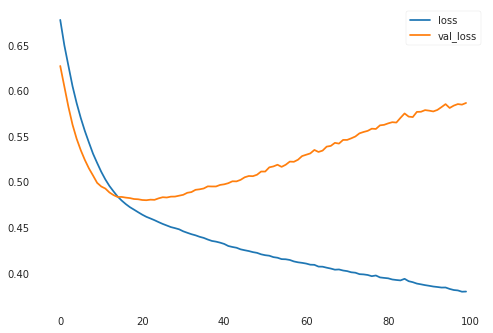

In [138]:
history_df = pd.DataFrame(history.history)
plt.plot(history_df['loss'], label='loss')
plt.plot(history_df['val_loss'], label='val_loss')

plt.legend()

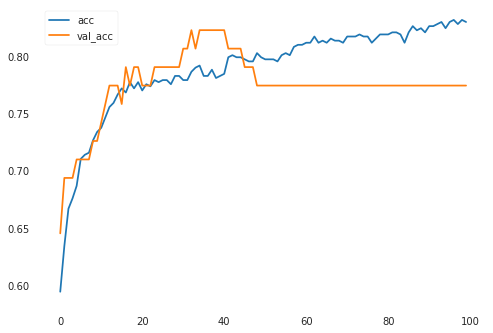

In [139]:
plt.plot(history_df['accuracy'], label='acc')
plt.plot(history_df['val_accuracy'], label='val_acc')

plt.legend()

#Prediction

In [140]:
y_pred = model.predict(X_test)


In [141]:
y_test

,Outcome
661,1
122,0
113,0
14,1
529,0
...,...
476,1
482,0
230,1
527,0


In [142]:
y_pred

array([[9.67965126e-01],
       [5.68422973e-02],
       [4.16063666e-02],
       [5.91649234e-01],
       [4.54610288e-02],
       [8.32352042e-03],
       [8.96413565e-01],
       [8.66490722e-01],
       [5.75095057e-01],
       [2.93508619e-01],
       [8.19012105e-01],
       [9.11726952e-01],
       [1.18319780e-01],
       [1.91262037e-01],
       [1.81817234e-01],
       [1.57957733e-01],
       [9.57439721e-01],
       [2.39989161e-03],
       [2.48525649e-01],
       [1.99309826e-01],
       [8.19867671e-01],
       [3.08298677e-01],
       [1.36407644e-01],
       [2.20279902e-01],
       [2.05579400e-03],
       [3.63460839e-01],
       [4.74351645e-03],
       [9.73772883e-01],
       [3.46992910e-02],
       [1.40615046e-01],
       [4.41740513e-01],
       [1.41870171e-01],
       [2.94161439e-02],
       [7.41131783e-01],
       [1.51510239e-02],
       [7.65935898e-01],
       [3.47079039e-01],
       [1.59859657e-02],
       [3.24990630e-01],
       [9.34567690e-01],


In [143]:
y_pred = y_pred > 0.5
y_pred

array([[ True],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [ True],
       [ True],
       [ True],
       [False],
       [ True],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [ True],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [False],
       [ True],
       [ True],
       [

In [144]:
pred = y_pred.astype('uint8')
pred

array([[1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [0],
    

#Classification Report
A classification report is a performance evaluation metric in machine learning. It is used to show the precision, recall, F1 Score, and support of your trained classification model. 

In [145]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.83      0.87      0.85       107
           1       0.67      0.60      0.63        47

    accuracy                           0.79       154
   macro avg       0.75      0.73      0.74       154
weighted avg       0.78      0.79      0.78       154



The accuracy is 79% for this particular dataset using deep neural network.